In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import anndata as ad
import seaborn as sns
from datetime import datetime
import time, gc, warnings, pickle, os, re
from PIL import Image, ImageColor   
import random, matplotlib
from scipy.sparse import csr_matrix, hstack, coo_matrix, coo_array
from scipy.stats import gaussian_kde
# from KDEpy import FFTKDE
from scipy.signal import convolve2d
from scipy.sparse import vstack
from scipy import signal
import ipyparallel as ipp
from matplotlib.colors import ListedColormap
from PIL import ImageColor
from matplotlib.ticker import AutoMinorLocator
import matplotlib.cm as cm

In [2]:
#Definition of custom functions used for plotting
def plot_shape(convolv_matrix, data, vmax_adjust=0.5, mask=np.ones((5000,5000))):
    x = data[:,1]
    y = data[:,0]
    plt.figure(figsize=(10,10))
    ax_0 = plt.subplot2grid((5,5), (0,0), colspan=4)
    ax_1 = plt.subplot2grid((5,5), (1,0), colspan=4, rowspan=4)
    ax_2 = plt.subplot2grid((5,5), (1,4), rowspan=4)
    hist_x = ax_0.hist(x, bins=50)
    hist_2d = ax_1.imshow((convolv_matrix*mask)[::-1,:], vmax=vmax_adjust*convolv_matrix.max(), cmap='magma')
    hist_y = ax_2.hist(y, bins=50, orientation='horizontal')
    ax_0.set_xticklabels([])
    ax_2.set_yticklabels([])
    ax_1.set_yticks(ticks=list(range(0,5001,1000)))
    ax_1.set_yticklabels(labels=[str(x) for x in list(range(5000,-1,-1000))])
    ax_1.set_xlabel('zipcode index')
    ax_1.set_ylabel('zipcode index')
    ax_0.grid(False)
    ax_1.grid(False)
    ax_2.grid(False)
    
def plot_gene(gene_name, adata, s=3, vmax_adjust=0.5, bw=5, mask=np.ones((5000,5000))): 
    plt.figure(figsize = (16,16))
    gene_idx = adata.var.reset_index().query('gene_name == @gene_name').index
    gene_data = csr_matrix((adata.X[:,gene_idx].reshape(5000,5000).toarray())*mask).tocoo()
    x_u, y_u = gene_data.row.reshape(-1,1), gene_data.col.reshape(-1,1)
    coord_list = np.hstack([x_u, y_u])
    count_list = gene_data.data.astype(int)
    total_list = [list(coord)*count for coord,count in zip(coord_list,count_list)]
    data = np.concatenate(total_list).reshape(-1,2)
    grid_xy = np.meshgrid(np.arange(-1,5001), np.arange(-1,5001))
    grid = np.hstack([grid_xy[1].reshape(-1,1), grid_xy[0].reshape(-1,1)])
    kde = FFTKDE(kernel='gaussian', bw=bw)
    points = kde.fit(data).evaluate(grid)
    z = points.reshape((5002,5002))[1:5001,1:5001][x_u,y_u]
    plt.figure(figsize=(12,12))
    plt.scatter(y_u, x_u, c=z, marker='h', s=s, edgecolor='none',
                       cmap='magma_r', vmin=0, vmax=vmax_adjust*max(z))
    plt.xlim(-250, 5350)
    plt.ylim(-250, 5350)
    plt.gca().set_aspect('equal')
    plt.title('%s mapped zipcode positions' % gene_name)
    plt.xlabel('zipcode index')
    plt.ylabel('zipcode index')
    plt.grid(False)
    print('plotted %s' % gene_name)

def plot_convolv_gene(adata, s=3, vmax_adjust=0.5, core_size=50, std=25, mask=np.ones((5000,5000))): 
    plt.figure(figsize = (16,16))
    gene_data = (adata.X.reshape(25000000,-1).sum(1).reshape(5000,5000).toarray())
    kernel = np.outer(signal.windows.gaussian(core_size, std),
                  signal.windows.gaussian(core_size, std))
    gmatrix = signal.fftconvolve(gene_data, kernel, mode='same')
    gene_data = coo_matrix(gene_data)
    x_u, y_u = gene_data.row.reshape(-1,1), gene_data.col.reshape(-1,1)
    z = gmatrix[x_u,y_u]
    plt.figure(figsize=(12,12))
    plt.scatter(y_u, x_u, c=z, marker='h', s=s, edgecolor='none',
                       cmap='magma_r', vmin=0, vmax=vmax_adjust*max(z))
    plt.xlim(-250, 5350)
    plt.ylim(-250, 5350)
    plt.gca().set_aspect('equal')
    plt.title('Sample shape')
    plt.xlabel('zipcode index')
    plt.ylabel('zipcode index')
    plt.grid(False)
    
def plot_gene_bg(bg, alpha, gene_name, adata, s=3, vmax_adjust=0.5, core_size=50, std=25, mask=np.ones((5000,5000))): 
    plt.figure(figsize = (16,16))
    gene_idx = adata.var.reset_index().query('gene_name == @gene_name').index
    gene_data = (adata.X[:,gene_idx].reshape(5000,5000).toarray())*mask
    kernel = np.outer(signal.windows.gaussian(core_size, std),
                  signal.windows.gaussian(core_size, std))
    gmatrix = signal.fftconvolve(gene_data, kernel, mode='same')
    gene_data = coo_matrix(gene_data)
    x_u, y_u = gene_data.row.reshape(-1,1), gene_data.col.reshape(-1,1)
    z = gmatrix[x_u,y_u]
    plt.figure(figsize=(12,12))
    plt.scatter(y_u, x_u, c=z, marker='h', s=s, edgecolor='none',
                       cmap='magma_r', vmin=0, vmax=vmax_adjust*max(z))
    plt.imshow(bg, extent=[0, 4999, 0, 4999], alpha=alpha)
    plt.xlim(0, 4999)
    plt.ylim(0, 4999)
    plt.gca().set_aspect('equal')
    plt.title('%s mapped zipcode positions' % gene_name)
    plt.xlabel('zipcode index')
    plt.ylabel('zipcode index')
    plt.grid(False)
    print('plotted %s' % gene_name)

def plot_gene_conv(gene_name, adata, s=3, vmax_adjust=0.5, core_size=50, std=25, mask=np.ones((5000,5000))): 
    plt.figure(figsize = (16,16))
    gene_idx = adata.var.reset_index().query('gene_name == @gene_name').index
    gene_data = (adata.X[:,gene_idx].reshape(5000,5000).toarray())*mask
    kernel = np.outer(signal.windows.gaussian(core_size, std),
                  signal.windows.gaussian(core_size, std))
    gmatrix = signal.fftconvolve(gene_data, kernel, mode='same')
    gene_data = coo_matrix(gene_data)
    x_u, y_u = gene_data.row.reshape(-1,1), gene_data.col.reshape(-1,1)
    z = gmatrix[x_u,y_u]
    plt.figure(figsize=(12,12))
    plt.scatter(y_u, x_u, c=z, marker='h', s=s, edgecolor='none',
                       cmap='magma_r', vmin=0, vmax=vmax_adjust*max(z))
    plt.xlim(-250, 5350)
    plt.ylim(-250, 5350)
    plt.gca().set_aspect('equal')
    plt.title('%s mapped zipcode positions' % gene_name)
    plt.xlabel('zipcode index')
    plt.ylabel('zipcode index')
    plt.grid(False)
    print('plotted %s' % gene_name)

def plot_gene_ax(ax, gene_name, adata, s=3, vmax_adjust=0.5, bw=5, mask=np.ones((5000,5000))): 
    gene_idx = adata.var.reset_index().query('gene_name == @gene_name').index
    gene_data = csr_matrix((adata.X[:,gene_idx].reshape(5000,5000).toarray())*mask).tocoo()
    x_u, y_u = gene_data.row.reshape(-1,1), gene_data.col.reshape(-1,1)
    coord_list = np.hstack([x_u, y_u])
    count_list = gene_data.data.astype(int)
    total_list = [list(coord)*count for coord,count in zip(coord_list,count_list)]
    data = np.concatenate(total_list).reshape(-1,2)
    grid_xy = np.meshgrid(np.arange(-1,5001), np.arange(-1,5001))
    grid = np.hstack([grid_xy[1].reshape(-1,1), grid_xy[0].reshape(-1,1)])
    kde = FFTKDE(kernel='gaussian', bw=bw)
    points = kde.fit(data).evaluate(grid)
    z = points.reshape((5002,5002))[1:5001,1:5001][x_u,y_u]
    ax.grid(False)
    ax.scatter(y_u, x_u, c=z, marker='h', s=s, edgecolor='none',
                       cmap='magma_r', vmin=0, vmax=vmax_adjust*max(z))
    ax.set_xlim(0, 5000)
    ax.set_ylim(0, 5000)
    ax.set_aspect('equal')
    ax.set_title('%s mapped zipcode positions' % gene_name)
    ax.set_xlabel('zipcode index')
    ax.set_ylabel('zipcode index')
    print('plotted %s' % gene_name)

def plot_group(adata_bin, group, cmap):
    bin_size =adata_bin.uns['bin_size']
    l2 = 5000 / bin_size
    conv_size =5
    l3 = l2 - conv_size + 1
    group = str(group)
    df_generank = sc.get.rank_genes_groups_df(adata_bin, group=group)
    #df_generank = df_generank.query('logfoldchanges > 2')
    fig, axs = plt.subplots(1, 6, figsize=(24, 4))
    ##### plot of data, groups in drop_list will not show
    df_group = adata_bin.obs.query('leiden == @group')

    z = z0.copy()
    x = df_group['array_col'].astype(int)
    y = df_group['array_row'].astype(int)
    z[5000//bin_size-1-y, x] = int(group)+1

    z1 = np.array([cmap[x] for x in z.reshape(-1)]).reshape(l3, l3,3)
    plt.tight_layout()
    axs[0].imshow(z1)
    axs[0].grid(False)
    axs[0].set_title('Distribution of group #%s' % group)
    axs[0].set_aspect('equal')
    axs[0].set_yticks(ticks=list(range(0,5000//(bin_size)+1,5000//(bin_size*5))))
    axs[0].set_yticklabels(labels=[str(x) for x in list(range(5000,-1,-1000))])
    axs[0].set_xticks(ticks=list(range(0,5000//(bin_size)+1,5000//(bin_size*5))))
    axs[0].set_xticklabels(labels=[str(x) for x in list(range(0,5001,1000))])
    for i, name in enumerate(list(df_generank['names'][:5])):
        plot_gene_ax(axs[i+1], name, adata_ori, 2, 0.8, 20, mask)
    plt.grid(False)
    plt.show()
    plt.close

In [3]:
sc.set_figure_params(facecolor="white", figsize=(8, 8)) #Options to generate figures of set size
sc.settings.verbosity = 3

In [4]:
if not os.path.exists('plots'):
    os.mkdir('plots')
adata = ad.read_h5ad("/home/jselab/ifeoma/STST02_matrix.h5ad") #change path to your desired directory !!!

In [5]:
adata

AnnData object with n_obs × n_vars = 25000000 × 19833
    obs: 'array_col', 'array_row'
    var: 'gene_ids'
    uns: 'input_files', 'total_counts', 'total_genes'

In [6]:
adata.X

<25000000x19833 sparse matrix of type '<class 'numpy.int64'>'
	with 37439997 stored elements in Compressed Sparse Row format>

In [7]:
adata.var_names_make_unique() # making the gene names unique
adata_ori = adata.copy()

In [8]:
# convolv matrix to visualize the data
total_matrix = coo_matrix(adata.X.sum(axis=1).reshape(5000,5000))
x_u, y_u = total_matrix.row.reshape(-1,1), total_matrix.col.reshape(-1,1)
coord_list = np.hstack([x_u, y_u])
count_list = total_matrix.data.astype(int)
total_list = [list(x)*y for x,y in zip(coord_list,count_list)]
data = np.concatenate(total_list).reshape(-1,2)
kernel = np.outer(signal.windows.gaussian(50, 25),
              signal.windows.gaussian(50, 25))
convolv_matrix = signal.fftconvolve(total_matrix.toarray(), kernel, mode='same')

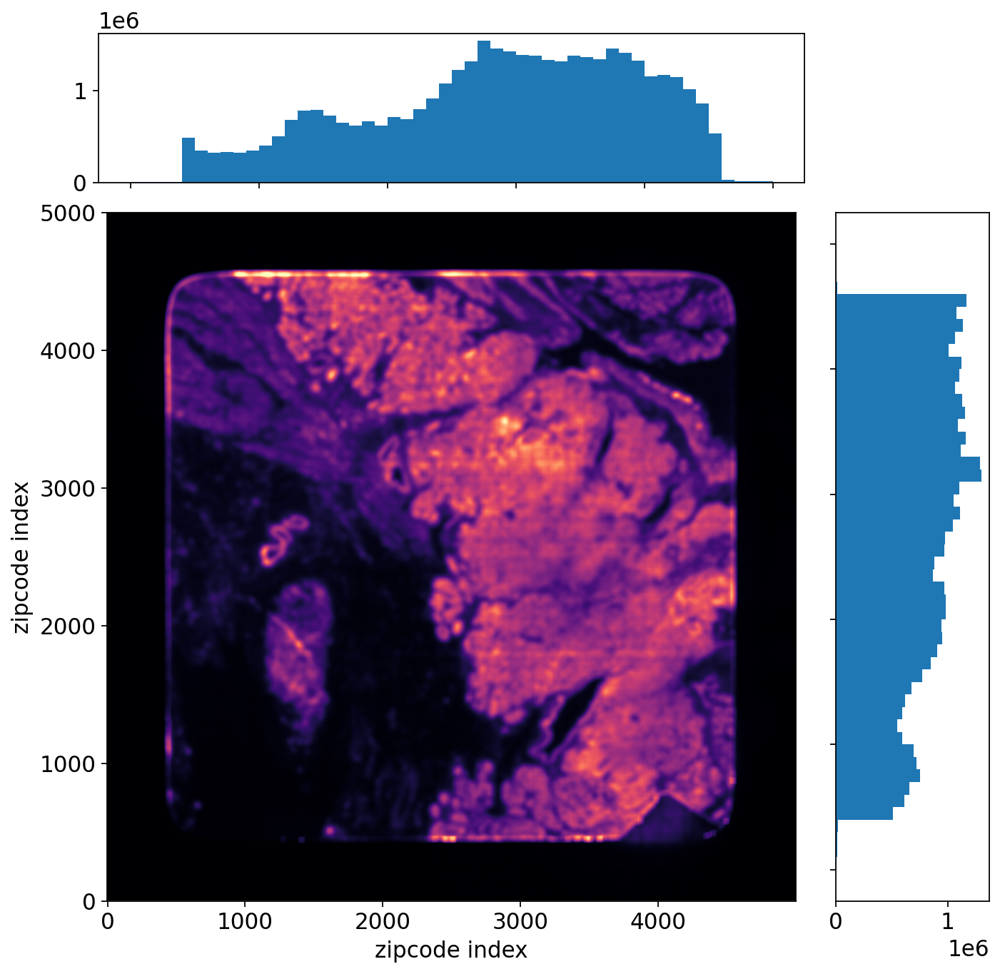

In [9]:
plot_shape(convolv_matrix, data, vmax_adjust=0.8) #vmax = vmax_adjust * convolv_matrix.max(), smaller the number, brighter the plot
x = np.linspace(0,5000,10000)
y = np.array([2500]*10000)
plt.scatter(x, y)

In [10]:
#Calculate total counts / genes per feature
adata.obs['total_counts'] = np.array(adata.X.sum(axis=1)).reshape(-1)
adata.obs['n_genes_by_counts'] = np.array((adata.X > 0).astype(int).sum(axis=1)).reshape(-1)

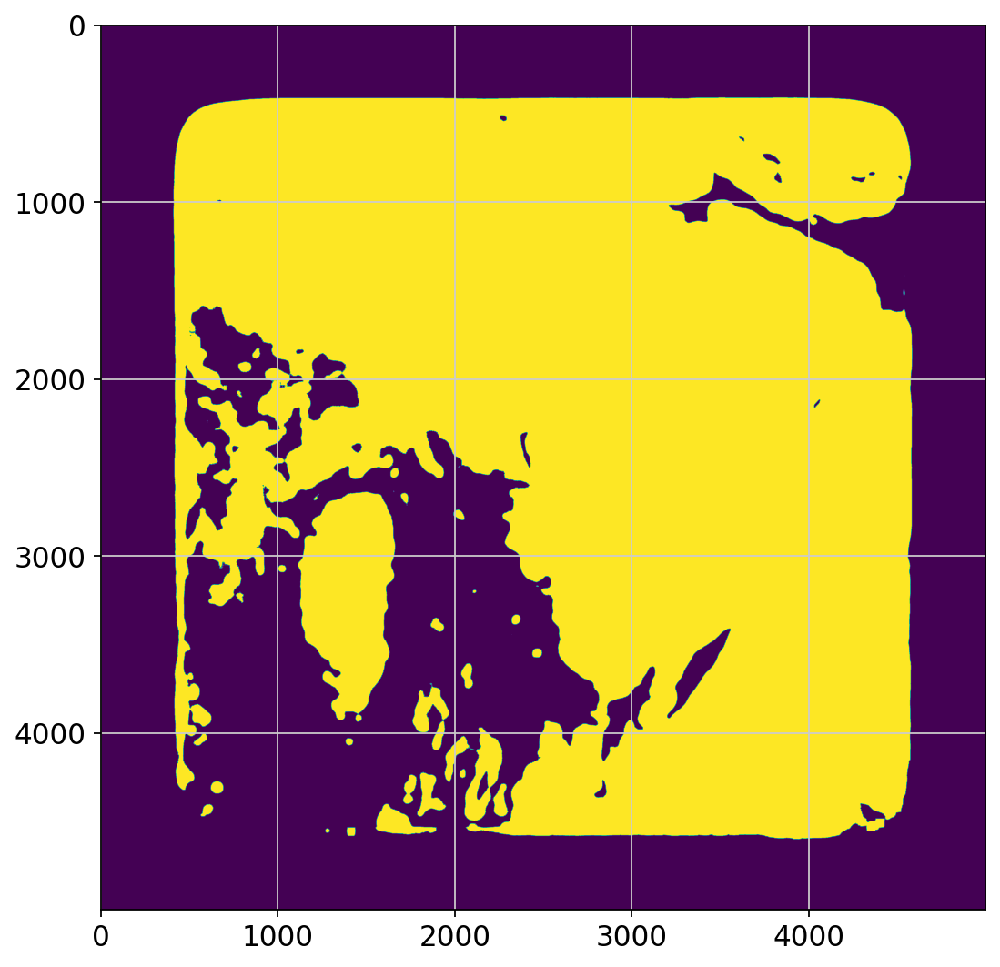

In [11]:
##Try to change thred to find a threshold that defines the shape of tissue well
#Spots that have a total transcript count > thred will be defined as 'in tissue', rest 'not in tissue' 
#and will be excluded from analysis. 
thred = 1000 
mask = (convolv_matrix > thred).astype(int) 
plt.imshow(mask[::-1, :])
mask0 = np.array(adata.obs['total_counts'] > 2).astype(int).reshape((5000,5000))

In [12]:
(np.array(adata.obs['total_counts']).reshape((5000,5000)) * mask).sum(axis=0).sum(axis=0)

38102199

In [13]:
adata.obs['mask'] = mask.reshape(-1).astype(bool)

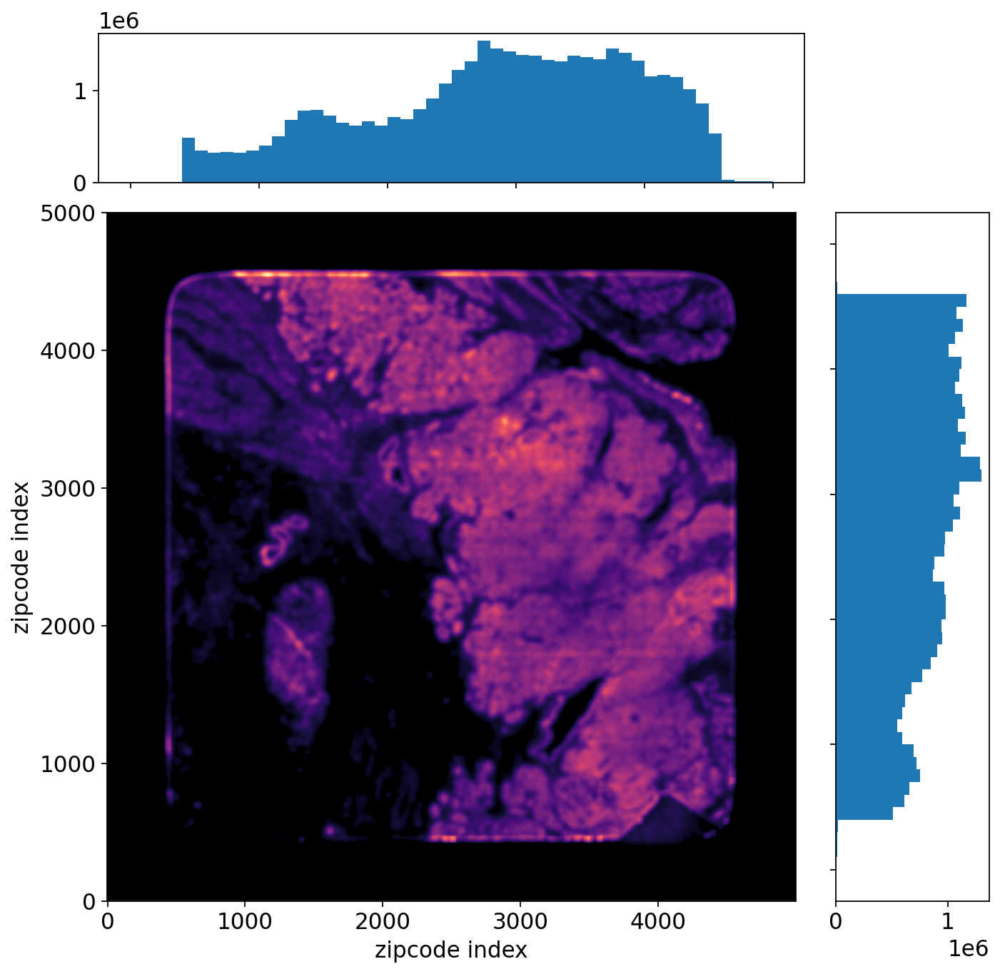

In [14]:
plot_shape(convolv_matrix, data, vmax_adjust=1, mask=mask)

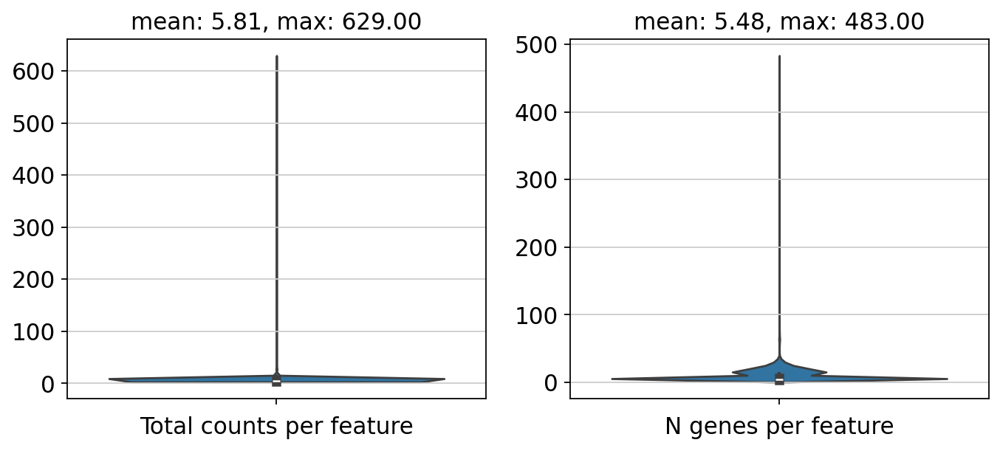

In [15]:
#Generate QC plot - this is to visualize # transcripts per spot and # of gene per feature
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
count_array = np.array(adata.obs["total_counts"])[(mask*mask0).reshape(-1).astype(bool)]
sns.violinplot(y = count_array, ax=axs[0])
axs[0].set_xlabel('Total counts per feature')
axs[0].title.set_text('mean: %.2f, max: %.2f' % (count_array.mean(), count_array.max()))
ngene_array = np.array(adata.obs["n_genes_by_counts"])[(mask*mask0).reshape(-1).astype(bool)]
sns.violinplot(y = ngene_array, ax=axs[1])
axs[1].set_xlabel('N genes per feature')
axs[1].title.set_text('mean: %.2f, max: %.2f' % (ngene_array.mean(), ngene_array.max()))
adata.obs['total_reads'] = np.array(adata.X.sum(axis=1)).reshape(-1)
adata.var['total_counts'] = np.array(adata.X.sum(axis=0)).reshape(-1)
plt.savefig('plots/qc_unbinned.png', bbox_inches='tight')

In [16]:
bin_size = 5
l = 5000
idx = np.arange(0, l**2).reshape(l, l//bin_size, bin_size)
clist = list()
for i in range(bin_size):
    clist.append(idx[i:l+1:bin_size, :, :])
bin_idx = np.stack(clist, axis=2).reshape(-1)
batch_idxs = np.split(bin_idx, 10)
X = adata.X.copy().T
total_var = X.shape[0]
batch_results = []
for batch_idx in batch_idxs:
    batch_results.append(csr_matrix(X[:,batch_idx].reshape(-1,bin_size**2).sum(1).reshape(total_var, -1)).T)
X_bin = vstack(batch_results)
obs_bin = adata.obs.copy()
obs_bin['array_col'] = (obs_bin['array_col']-1) //bin_size + 1
obs_bin['array_row'] = (obs_bin['array_row']-1) // bin_size + 1
obs_bin = obs_bin.groupby(['array_row','array_col']).sum().reset_index().sort_values(['array_row','array_col'])
adata_bin = ad.AnnData(X = csr_matrix(X_bin), obs = obs_bin, var = adata.var, uns = adata.uns)
adata_bin_ori = adata_bin.copy()

/home/jselab/miniconda3/envs/spatial/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [17]:
l2 = l // bin_size
idx = np.arange(0, l2**2).reshape(l2, l2)
conv_size = 5
conv_index = list()
for i in range(l2 - conv_size + 1):
    for j in range(l2 - conv_size + 1):
        conv_index += list(idx[i:i+conv_size, j:j+conv_size].reshape(-1))
parts = 10
interval = len(conv_index) / conv_size**2 / parts
prev = 0
batch_idxs = []
for i in range(1, parts):
    batch_idxs.append(conv_index[prev: int(i*interval)*(conv_size**2)])
    prev = int(i*interval)*(conv_size**2)
batch_idxs.append(conv_index[prev:])
X = adata_bin.X.copy().T
total_var = X.shape[0]
batch_results = []
for batch_idx in batch_idxs:
    batch_results.append(csr_matrix(X[:,batch_idx].reshape(-1,conv_size**2).sum(1).reshape(total_var, -1)).T)
X_conv = vstack(batch_results)
l3 = l2 - conv_size + 1
X, Y = np.meshgrid(range(1, l3+1), range(l3,0,-1))
obs_conv = pd.DataFrame(np.hstack((X.reshape(-1,1), Y.reshape(-1,1))), columns = ['x', 'y'])
obs_conv.columns = ['array_col', 'array_row']
adata_bin = ad.AnnData(X = csr_matrix(X_conv), obs = obs_conv, var = adata.var, uns = adata.uns)

/home/jselab/miniconda3/envs/spatial/lib/python3.11/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [18]:
adata_bin.write("/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/stst02adata_seurat_binned_output.h5ad", compression='lzf')

In [19]:
adata_bin

AnnData object with n_obs × n_vars = 992016 × 19833
    obs: 'array_col', 'array_row'
    var: 'gene_ids', 'total_counts'
    uns: 'input_files', 'total_counts', 'total_genes'

In [20]:
adata_bin.obs['ngenes'] = (adata_bin.X > 0).sum(axis = 1)

In [21]:
adata_bin.uns = {'bin_size': bin_size, 'conv_size': conv_size, 'l': l, 'l2': l2, 'l3': l3}

/tmp/ipykernel_283821/1556779883.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata_bin.obs["total_counts"], kde=False, ax=axs[0])
/tmp/ipykernel_283821/1556779883.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata_bin.obs["ngenes"], kde=False, bins=60, ax=axs[1])


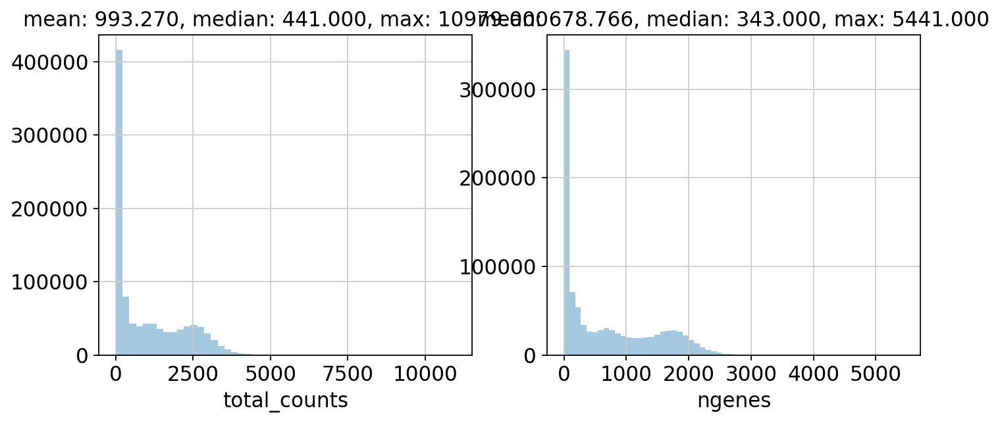

In [22]:
#Generating mitochondria QC variables
sc.pp.calculate_qc_metrics(adata_bin, inplace=True)
#generate QC plot
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
sns.distplot(adata_bin.obs["total_counts"], kde=False, ax=axs[0])
axs[0].title.set_text('mean: %.3f, median: %.3f, max: %.3f' % (adata_bin.obs["total_counts"].mean(), adata_bin.obs["total_counts"].median(), adata_bin.obs["total_counts"].max()))
sns.distplot(adata_bin.obs["ngenes"], kde=False, bins=60, ax=axs[1])
axs[1].title.set_text('mean: %.3f, median: %.3f, max: %.3f' % (adata_bin.obs["ngenes"].mean(), adata_bin.obs["ngenes"].median(), adata_bin.obs["ngenes"].max()))

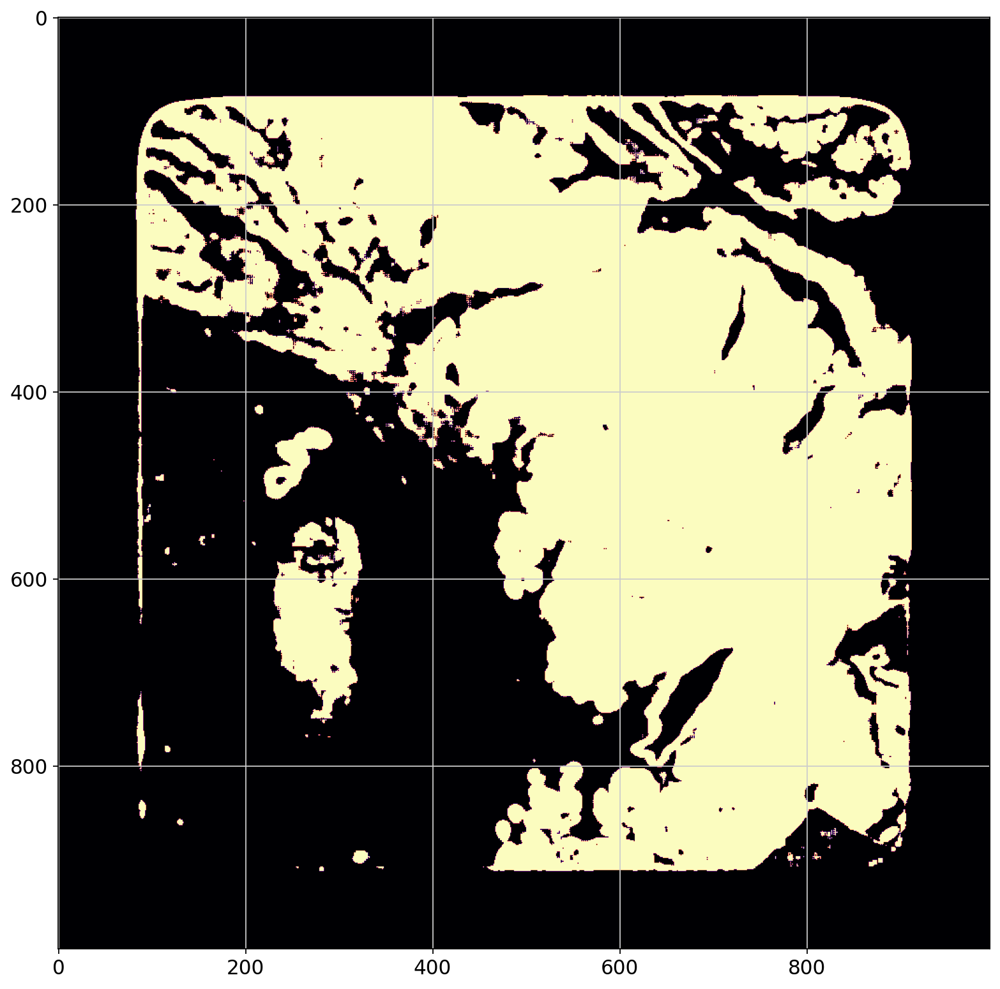

In [23]:
thred = 1000
df_count = adata_bin.obs[['total_counts', 'array_col', 'array_row']].copy()
df_count = df_count[df_count.total_counts > thred]
z0 = np.zeros((l3, l3))
z0[df_count['array_row'], df_count['array_col']] = -1
plt.figure(figsize=(12,12))
plt.imshow(-z0, cmap='magma')

In [24]:
sc.pp.filter_cells(adata_bin, min_counts=thred)

filtered out 601321 cells that have less than 1000 counts


/tmp/ipykernel_283821/3102371512.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata_bin.obs["total_counts"], kde=False, ax=axs[0])
/tmp/ipykernel_283821/3102371512.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(adata_bin.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])


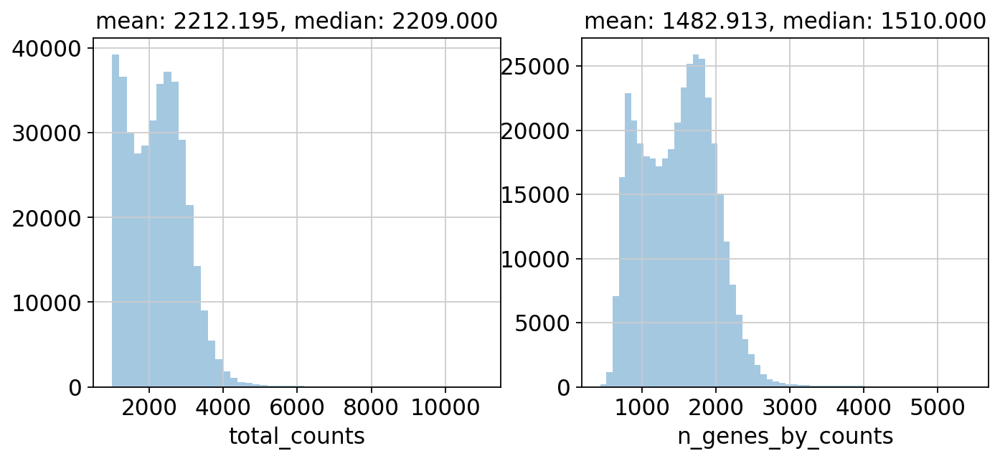

In [25]:
#generate QC plot after filtering
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
sns.distplot(adata_bin.obs["total_counts"], kde=False, ax=axs[0])
axs[0].title.set_text('mean: %.3f, median: %.3f' % (adata_bin.obs["total_counts"].mean(), adata_bin.obs["total_counts"].median()))
sns.distplot(adata_bin.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])
axs[1].title.set_text('mean: %.3f, median: %.3f' % (adata_bin.obs["n_genes_by_counts"].mean(), adata_bin.obs["n_genes_by_counts"].median()))
# fig.savefig(f'{output_dir}/qc_tissue.png')

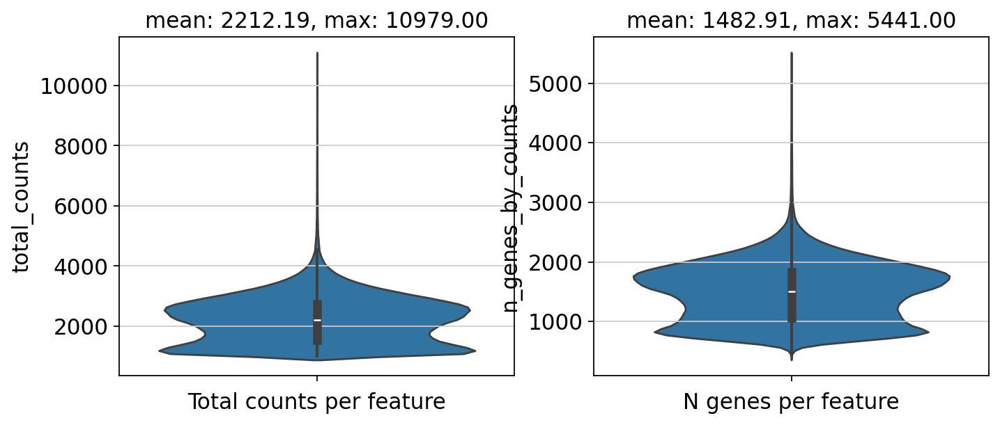

In [26]:
#generate QC plot
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
count_array = adata_bin.obs["total_counts"]
sns.violinplot(y = count_array, ax=axs[0])
axs[0].set_xlabel('Total counts per feature')
axs[0].title.set_text('mean: %.2f, max: %.2f' % (count_array.mean(), count_array.max()))
ngene_array = adata_bin.obs["n_genes_by_counts"]
sns.violinplot(y = ngene_array, ax=axs[1])
axs[1].set_xlabel('N genes per feature')
axs[1].title.set_text('mean: %.2f, max: %.2f' % (ngene_array.mean(), ngene_array.max()))
# fig.savefig(f'{output_dir}/qc_tissue2.png')
#axs[0].grid(False)
#axs[1].grid(False)

In [27]:
min_genes=200
min_cells=200

In [28]:
sc.pp.filter_cells(adata_bin, min_genes=min_genes)
sc.pp.filter_genes(adata_bin, min_cells=min_cells)
sc.pp.normalize_total(adata_bin, inplace=True)
sc.pp.log1p(adata_bin)

filtered out 2175 genes that are detected in less than 200 cells
normalizing counts per cell
    finished (0:00:02)


In [29]:
sc.tl.pca(adata_bin, svd_solver = 'arpack')

computing PCA
    with n_comps=50
    finished (0:03:45)


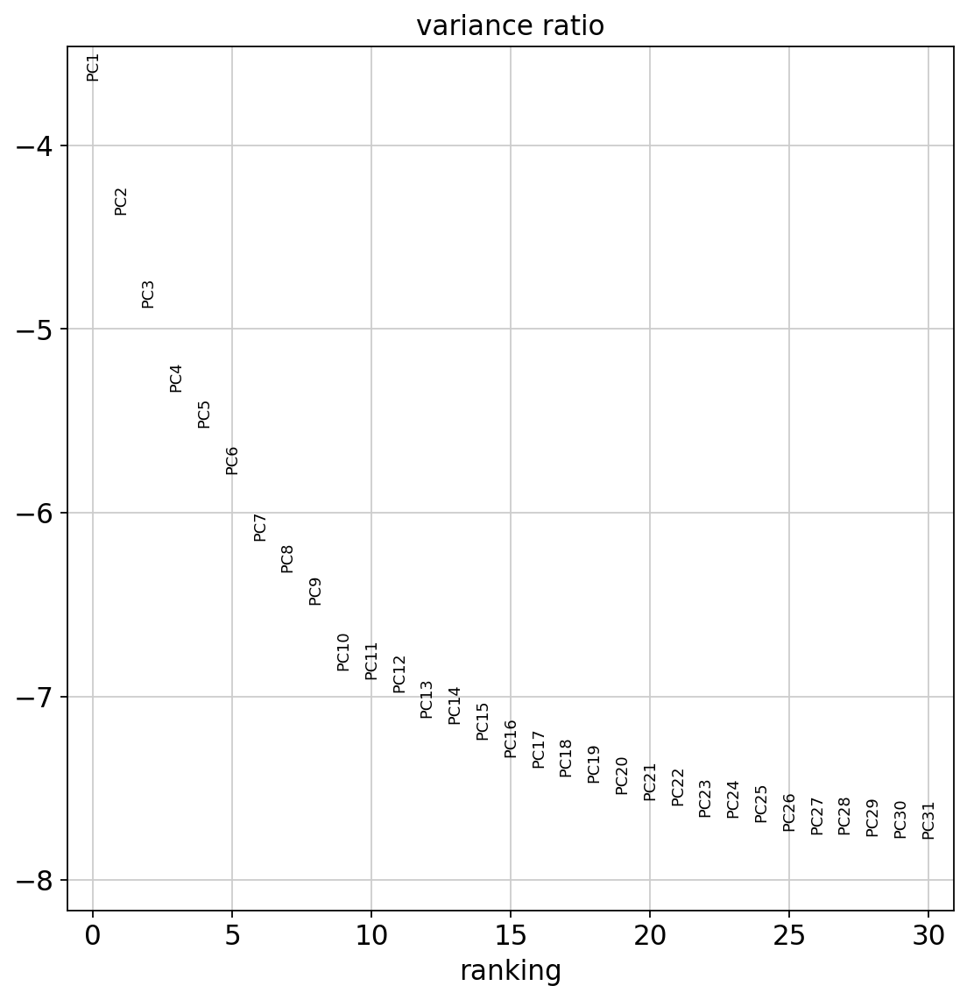

In [30]:
sc.pl.pca_variance_ratio(adata_bin, log = True)

In [53]:
top_genes = 3000
n_comps = 15
random_state = 4
flavor = 'seurat_v3'


In [32]:
##sc.pp.highly_variable_genes(adata_bin, flavor="seurat_v3", n_top_genes=3000)

# Subset to top 3000 highly variable genes
##top_genes = adata_bin.var[adata_bin.var['highly_variable']]
##top_genes.to_csv("/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/3000_tp_genes/Query_tp_genes_binned_3000_genes.csv", index=True)

extracting highly variable genes


/home/jselab/miniconda3/envs/spatial/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [33]:
##top_genes = 3000
##n_comps = 15
##random_state = 4
##flavor = 'seurat_v3'

In [54]:
adata_bin = adata_bin[:, adata_bin.var.highly_variable]
sc.pp.pca(adata_bin, n_comps=n_comps, random_state=random_state)
sc.pp.neighbors(adata_bin)
sc.tl.umap(adata_bin)
sc.tl.leiden(adata_bin, key_added="leiden", resolution= 0.3)

computing PCA
    with n_comps=15


/home/jselab/miniconda3/envs/spatial/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:325: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:28)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:25)


In [55]:
adata_bin.obs

,array_col,array_row,ngenes,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,n_counts,n_genes,leiden,cell type
83942,279,912,1041,1041,6.948897,1413,7.254178,20.523708,27.600849,40.481246,61.712668,1413,1041,13,Fibroblast
83943,280,912,1358,1358,7.214504,1862,7.529943,19.548872,25.134264,35.875403,53.920516,1862,1358,13,Fibroblast
83944,281,912,1413,1413,7.254178,1949,7.575585,19.394561,24.987173,35.248846,53.155464,1949,1413,13,Fibroblast
83945,282,912,1371,1371,7.224025,1892,7.545918,19.503171,25.211416,35.782241,53.964059,1892,1371,13,Fibroblast
83946,283,912,920,920,6.825460,1191,7.083388,19.479429,27.875735,39.546599,64.735516,1191,920,13,Fibroblast
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
909137,786,84,872,872,6.771936,1177,7.071573,24.129142,32.625319,42.905692,68.394223,1177,872,7,CD4+ T cell
909138,787,84,806,806,6.693324,1098,7.002156,24.954463,34.061931,44.808743,72.131148,1098,806,7,CD4+ T cell
909139,788,84,859,859,6.756932,1161,7.057898,23.944875,32.558140,43.238587,69.078381,1161,859,7,CD4+ T cell
909140,789,84,768,768,6.645091,1018,6.926577,24.361493,34.184676,44.204322,73.673870,1018,768,7,CD4+ T cell


THE CODE BELOW EXTRACTS ALL TOPMOST EXPRESSED GENES IN ALL THE CLUSTERS

In [37]:
# Step 1: Calculate highly variable genes
##sc.pp.highly_variable_genes(adata_bin, flavor="seurat_v3", n_top_genes=3000)

# Step 2: Extract highly variable genes
##top_genes = adata_bin.var[adata_bin.var['highly_variable']].copy()

# Step 3: Perform differential expression analysis to get log-fold changes and p-values
# Ensure you have a clustering/grouping in `adata_bin.obs`, e.g., "leiden" or "louvain"
##sc.tl.rank_genes_groups(adata_bin, groupby='leiden', method='wilcoxon')

# Step 4: Extract log-fold changes and p-values
##ranked_genes = sc.get.rank_genes_groups_df(adata_bin, group=None)  # Get all groups

# Step 5: Merge highly variable genes with log-fold changes and p-values
# Join on gene index
##top_genes = top_genes.merge(ranked_genes, left_index=True, right_on='names', how='inner')

# Step 6: Save the results
##top_genes.to_csv(
    ##"/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/3000_tp_genes/Query_tp_genes_statsig_3000_genes_with_stats.csv", 
    ##index=False
##)
##print("Top 3000 highly variable genes with log-fold changes and p-values saved.")


THE CODE BELOW EXTRACTS TOP EXPRESSED GENES IN JUST 1 CLUSTER (CLUSTER 0)

In [38]:
##import scanpy as sc

# Step 1: Calculate highly variable genes
##sc.pp.highly_variable_genes(adata_bin, flavor="seurat_v3", n_top_genes=3000)

# Step 2: Subset to the top highly variable genes
##top_genes_hvg = adata_bin.var[adata_bin.var['highly_variable']].copy()

# Step 3: Perform differential expression analysis to get log-fold changes and p-values
# Ensure you have a clustering/grouping in `adata_bin.obs`, e.g., "leiden" or "louvain"
##sc.tl.rank_genes_groups(adata_bin, groupby='leiden', method='wilcoxon')

# Step 4: Extract differential expression results for Cluster 1
##cluster_1_genes = sc.get.rank_genes_groups_df(adata_bin, group='1')  # Specify Cluster 1

# Step 5: Filter `cluster_1_genes` to include only top 3000 highly variable genes
# Retain only genes in the `highly_variable` subset
##filtered_cluster_1_genes = cluster_1_genes[cluster_1_genes['names'].isin(top_genes_hvg.index)].copy()

# Step 6: Ensure no more than 3000 genes
##filtered_cluster_1_genes = filtered_cluster_1_genes.head(3000)

# Step 7: Save the results
##filtered_cluster_1_genes.to_csv(
    ##"/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/3000_tp_genes/Cluster_1_tp_genes_3000.csv",
    ##index=False
##)
##print("Top 3000 highly variable genes for Cluster 1 with log-fold changes and p-values saved.")

THE CODE BELOW EXTRACTS TOP EXPRESSED GENES FROM CLUSTER 1

In [39]:
##import scanpy as sc

# Step 1: Calculate highly variable genes
##sc.pp.highly_variable_genes(adata_bin, flavor="seurat_v3", n_top_genes=3000)

# Step 2: Subset to the top highly variable genes
##top_genes_hvg = adata_bin.var[adata_bin.var['highly_variable']].copy()

# Step 3: Filter the dataset for group 1
##adata_group_1 = adata_bin[adata_bin.obs['group'] == '1']  # Adjust if `group` column is numeric (e.g., == 1 without quotes)

# Step 4: Perform differential expression analysis on filtered data
##sc.tl.rank_genes_groups(adata_group_1, groupby='group', method='wilcoxon')  # Using `group` column for clustering

# Step 5: Extract differential expression results for Group 1
##group_1_genes = sc.get.rank_genes_groups_df(adata_group_1, group='1')  # Specify Group 1

# Step 6: Filter `group_1_genes` to include only top 3000 highly variable genes
# Retain only genes in the `highly_variable` subset
##filtered_group_1_genes = group_1_genes[group_1_genes['names'].isin(top_genes_hvg.index)].copy()

# Step 7: Ensure no more than 3000 genes
##filtered_group_1_genes = filtered_group_1_genes.head(3000)

# Step 8: Save the results
##filtered_group_1_genes.to_csv(
    ##"/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/3000_tp_genes/Group_1_tp_genes_3000.csv",
    ##index=False
##)
##print("Top 3000 highly variable genes for Group 1 with log-fold changes and p-values saved.")


In [40]:
adata_bin.write('/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/stst02matrix_newseuratb2_v1_filtered_0.3resleiden.h5ad', compression='lzf')

In [41]:
data_bin = ad.read_h5ad('/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/stst02matrix_newseuratb2_v1_filtered_0.3resleiden.h5ad')

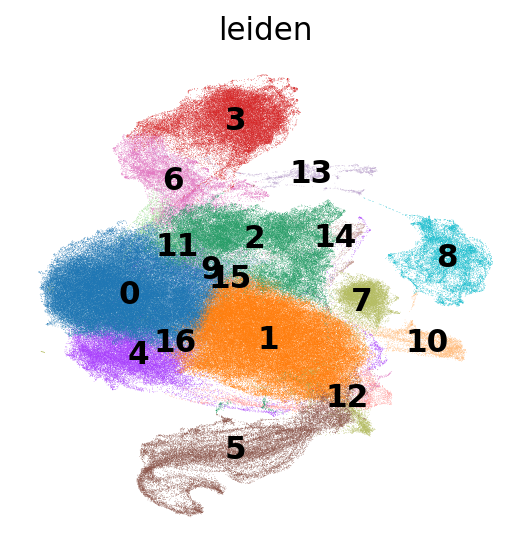

In [42]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata_bin, color = ['leiden'], wspace = 0.4, frameon = False, legend_loc = "on data")
plt.close()

In [43]:
cell_type = {"0":"MYB/Tumor cluster",
"1":"Plasma cell",
"2":"Basal",
"3":"Perivascular",
"4":"Cycling cells",
"5":"Salivary gland cells",
"6":"Adventitial Fibroblast",
"7":"CD4+ T cell",
"8":"Mucinous Acini",
"9":"Duct Epithelial",
"10":"Ionocyte",
"11":"Lymphatic Endothelial",
"12":"Macrophage/NK cells",
"13":"Fibroblast",
"14":"Serous Acini",
"15":"Myoepithelial",
"16":"MYB/Tumor cluster"
}

In [44]:
adata_bin.obs.leiden.map(cell_type)

83942      Fibroblast
83943      Fibroblast
83944      Fibroblast
83945      Fibroblast
83946      Fibroblast
             ...     
909137    CD4+ T cell
909138    CD4+ T cell
909139    CD4+ T cell
909140    CD4+ T cell
909141    CD4+ T cell
Name: leiden, Length: 390695, dtype: object

THIS IS THE ACTUAL MAPPING WITH MATCHING COLORS TO OF THE LABELLED AND UNLABELED CLUSTERS

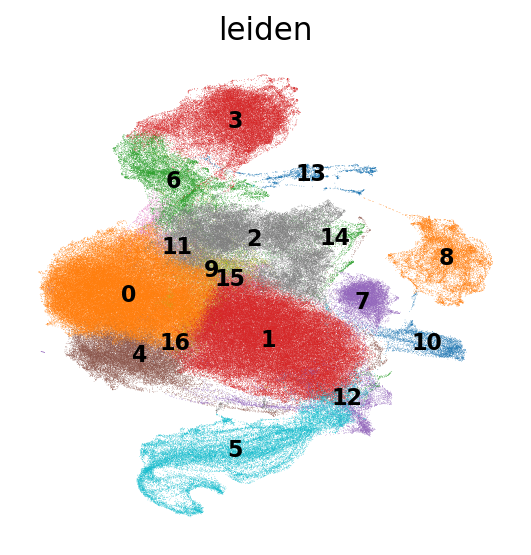

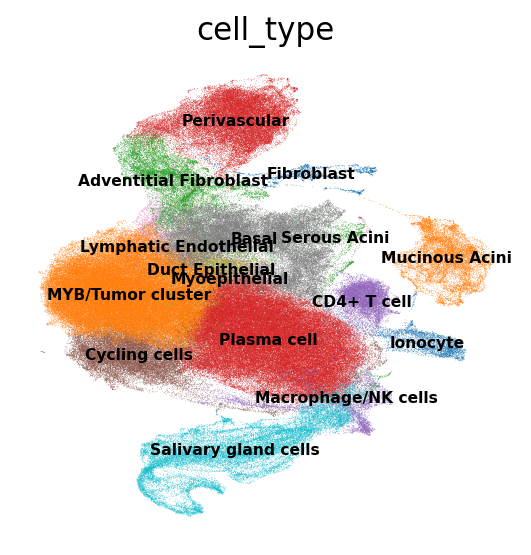

In [58]:
# Ensure that `cell_type` is a dictionary mapping leiden clusters to cell types
# Example:
cell_type = {"0":"MYB/Tumor cluster",
"1":"Plasma cell",
"2":"Basal",
"3":"Perivascular",
"4":"Cycling cells",
"5":"Salivary gland cells",
"6":"Adventitial Fibroblast",
"7":"CD4+ T cell",
"8":"Mucinous Acini",
"9":"Duct Epithelial",
"10":"Ionocyte",
"11":"Lymphatic Endothelial",
"12":"Macrophage/NK cells",
"13":"Fibroblast",
"14":"Serous Acini",
"15":"Myoepithelial",
"16":"MYB/Tumor cluster"}  # Replace with your actual mapping

# Map 'leiden' to 'cell_type' and save to a new column in adata_bin.obs
adata_bin.obs['cell_type'] = adata_bin.obs['leiden'].map(cell_type)

# Define separate color palettes for 'leiden' and 'cell_type'
leiden_colors = sns.color_palette("tab10", n_colors=len(adata_bin.obs['leiden'].unique()))
cell_type_colors = sns.color_palette("tab10", n_colors=len(adata_bin.obs['cell_type'].unique()))

# Create dictionaries mapping 'leiden' and 'cell_type' categories to their respective colors
leiden_color_dict = dict(zip(adata_bin.obs['leiden'].unique(), leiden_colors))
cell_type_color_dict = dict(zip(adata_bin.obs['cell_type'].unique(), cell_type_colors))

# Plot UMAP with the 'leiden' color palette
plt.rcParams["figure.figsize"] = (4, 4)
plt.rcParams['font.size'] = 10
sc.pl.umap(adata_bin, color=['leiden'], palette=leiden_color_dict, wspace=0.4, frameon=False, legend_loc="on data")
plt.close()

# Plot UMAP with the 'cell_type' color palette
plt.rcParams["figure.figsize"] = (4, 4)
plt.rcParams['font.size'] = 7
sc.pl.umap(adata_bin, color=['cell_type'], palette=cell_type_color_dict, frameon=False, legend_loc="on data")
plt.close()

In [60]:
adata_bin.obs['cell type'] = adata_bin.obs.leiden.map(cell_type)

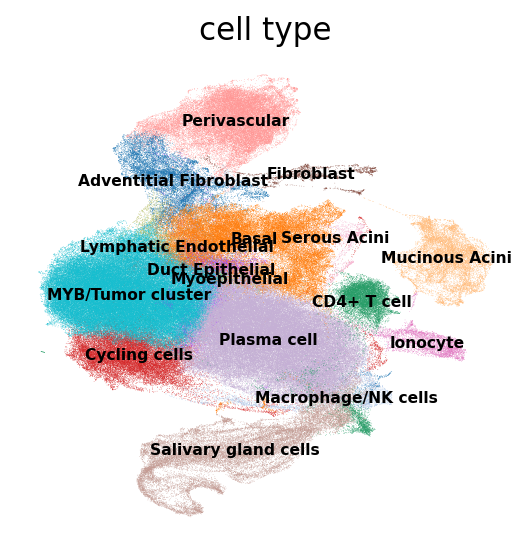

In [61]:
plt.rcParams["figure.figsize"] = (4, 4)
plt.rcParams['font.size'] = 7            # Overall font size
plt.rcParams['axes.titlesize'] = 14     # Title font size
plt.rcParams['axes.labelsize'] = 6      # Axes labels font size
plt.rcParams['xtick.labelsize'] = 6     # X-axis tick labels font size
plt.rcParams['ytick.labelsize'] = 6     # Y-axis tick labels font size
plt.rcParams['legend.fontsize'] = 6     
sc.pl.umap(adata_bin, color = ['cell type'], frameon = False, legend_loc = "on data")
plt.close()

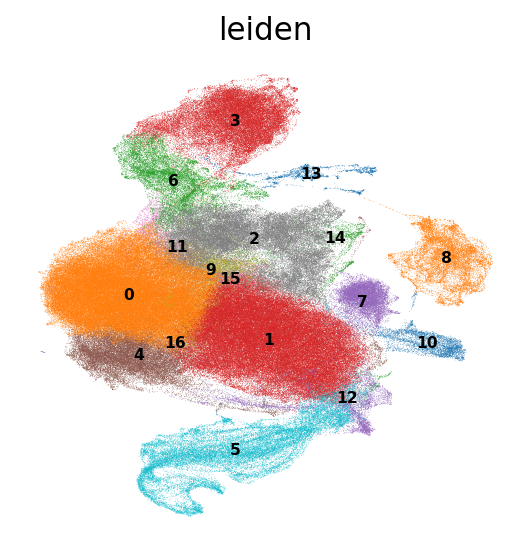

In [63]:
sc.pl.umap(adata_bin, color = ['leiden'], frameon = False, legend_loc = "on data")
plt.close()

In [64]:
for x in range (0,17):
    print(f'"{x}":"",')

"0":"",
"1":"",
"2":"",
"3":"",
"4":"",
"5":"",
"6":"",
"7":"",
"8":"",
"9":"",
"10":"",
"11":"",
"12":"",
"13":"",
"14":"",
"15":"",
"16":"",


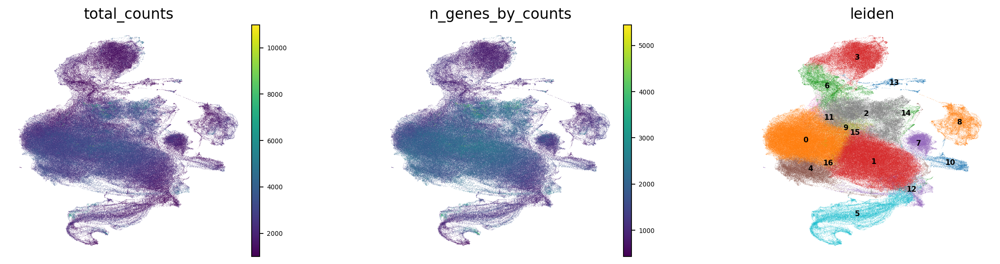

In [65]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata_bin, color = ['total_counts', 'n_genes_by_counts', 'leiden'], wspace = 0.4, frameon = False, legend_loc = "on data")
plt.close()

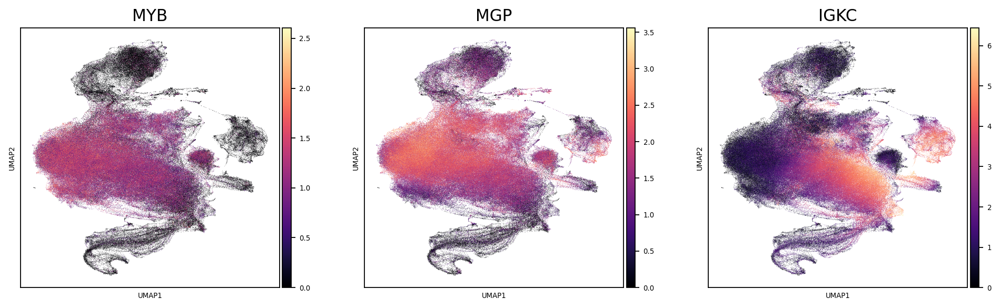

In [66]:
sc.pl.umap(adata_bin, color = ["MYB", "MGP", "IGKC"], color_map='magma')

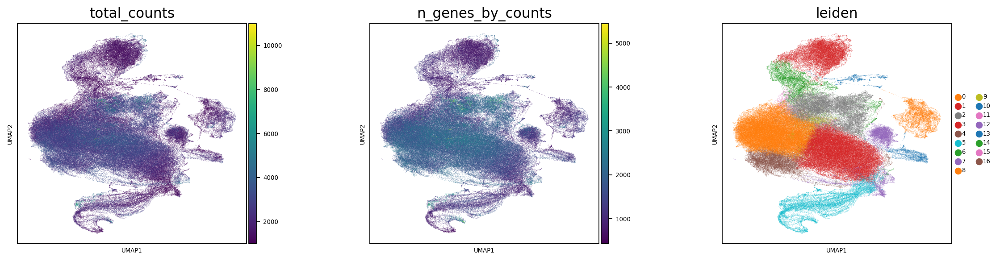

In [67]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata_bin, color = ['total_counts', 'n_genes_by_counts', 'leiden'], wspace = 0.4)
plt.close()

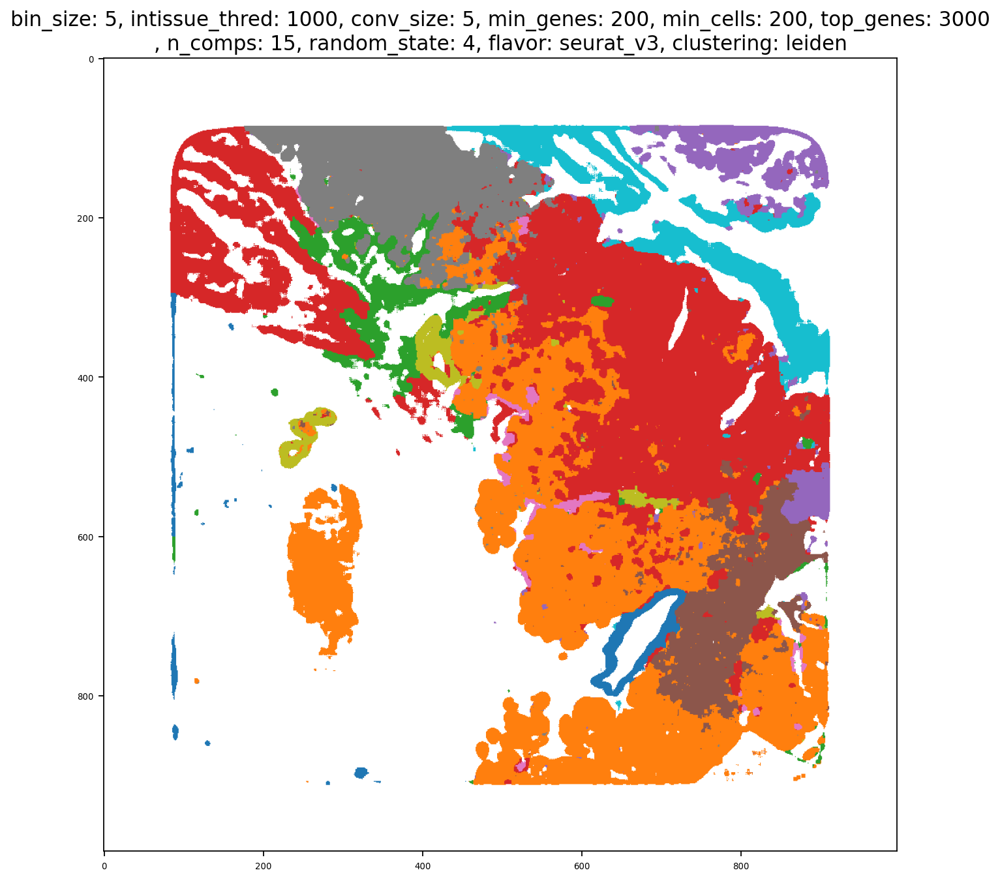

In [68]:
cluster_name = 'leiden'
df_obs = adata_bin.obs.copy()
df_obs['clusters'] = df_obs[cluster_name]
df_obs['clusters'] = df_obs['clusters'].astype(int)
drop_list = []
cmap = dict(zip([-1, 0]+list(np.unique(df_obs['clusters'].astype(int))+1),[(220,220,220), (255,255,255)]+[ImageColor.getcolor(x, "RGB") for x in adata_bin.uns[cluster_name+'_colors']]))
df_obs = df_obs.query('clusters != @drop_list')
#df_obs = df_obs.query('clusters == @include_list')

z = z0.copy()
x = df_obs['array_col'].astype(int)
y = df_obs['array_row'].astype(int)
group = df_obs['clusters'].astype(int)
z[y, x] = group+1

#random.shuffle(order)
plt.figure(figsize = (10,10))
for gp in np.unique(group):
    gp += 1
    if gp != 0:
        plt.scatter(x=[],y=[],color=np.array(cmap[gp])/255, label=gp-1)
plt.scatter(x=[],y=[],color=np.array((200,200,200))/255, label='Filtered out tissue')
z1 = np.array([cmap[x] for x in z.reshape(-1)]).reshape(l3,l3,3)
plt.imshow(z1)
plt.title('bin_size: %s, intissue_thred: %s, conv_size: %s, min_genes: %s, min_cells: %s, top_genes: %s\n, n_comps: %s, random_state: %s, flavor: %s, clustering: %s' % (bin_size, thred, conv_size, min_genes, min_cells, top_genes, n_comps, random_state, flavor, cluster_name))
# plt.legend(df_obs['clusters'])
plt.grid(False)
plt.show()
plt.close()

In [47]:
sc.tl.rank_genes_groups(adata_bin, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_bin, n_genes=15, sharey=False)

# Get the DataFrame of ranked genes
df = sc.get.rank_genes_groups_df(adata_bin, None)

# Save the DataFrame to a CSV file
df.to_csv('/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/stst02rank_genes_groups_newseurat_ncmps15_0_13.csv', index=False)

# Print confirmation
print("Ranked genes groups saved to CSV.")

ranking genes


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:05)


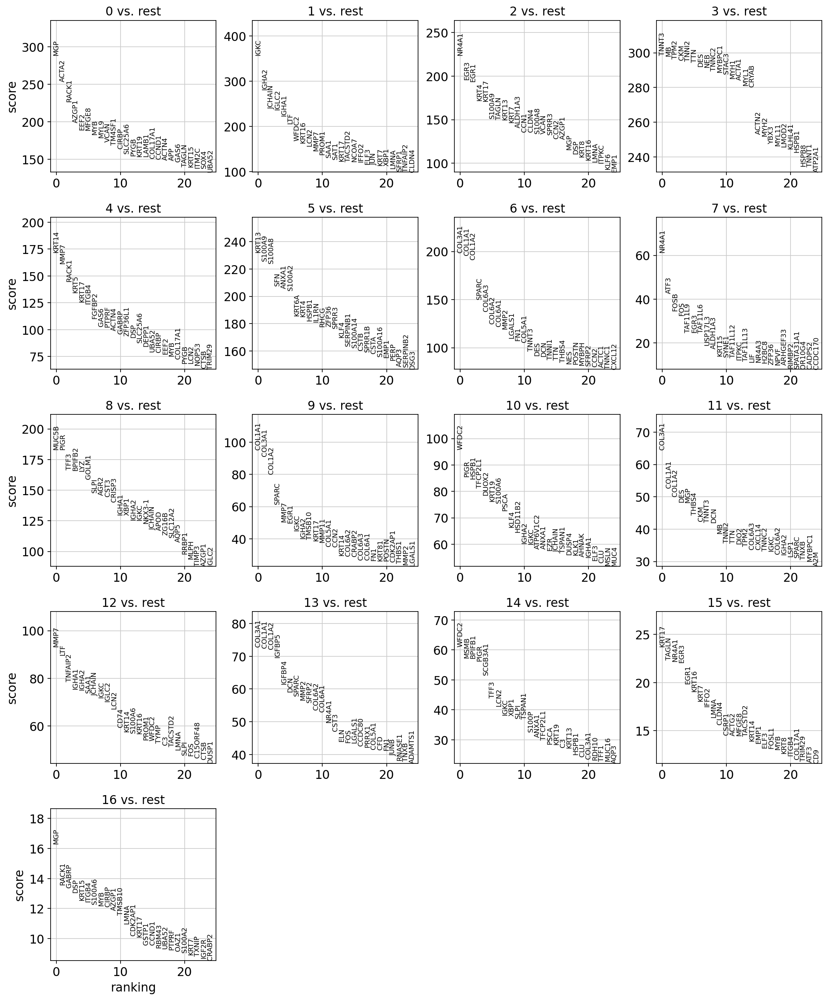

In [48]:
# adata_bin.uns['rank_genes_groups']
sc.tl.rank_genes_groups(adata_bin, 'leiden', method = 'wilcoxon')
sc.pl.rank_genes_groups(adata_bin, n_genes = 25, sharey = False)
sc.get.rank_genes_groups_df(adata_bin, None)
df.to_csv('/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/stst02rank_seuratt_genes_groups.csv', index=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:05)


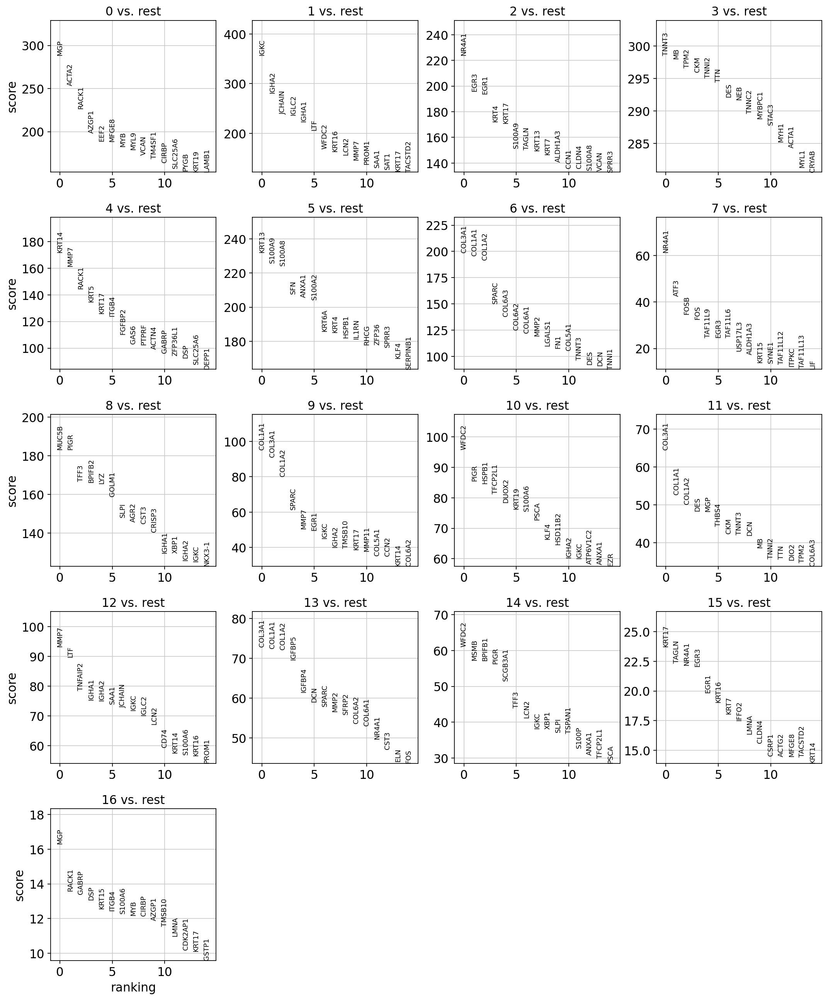

Ranked genes groups saved to CSV.


In [49]:
sc.tl.rank_genes_groups(adata_bin, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_bin, n_genes=15, sharey=False)

# Get the DataFrame of ranked genes
df = sc.get.rank_genes_groups_df(adata_bin, None)

# Save the DataFrame to a CSV file
df.to_csv('/home/jselab/ifeoma/latest_preprocessing/new_seurat_flavor/stst02rank_seuratgenes_groups_ncmps15_0_12_top15_genes.csv', index=False)

# Print confirmation
print("Ranked genes groups saved to CSV.")

CODE BELOW FOR PRINTING ACTUAL 15 TOP GENES.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:05)


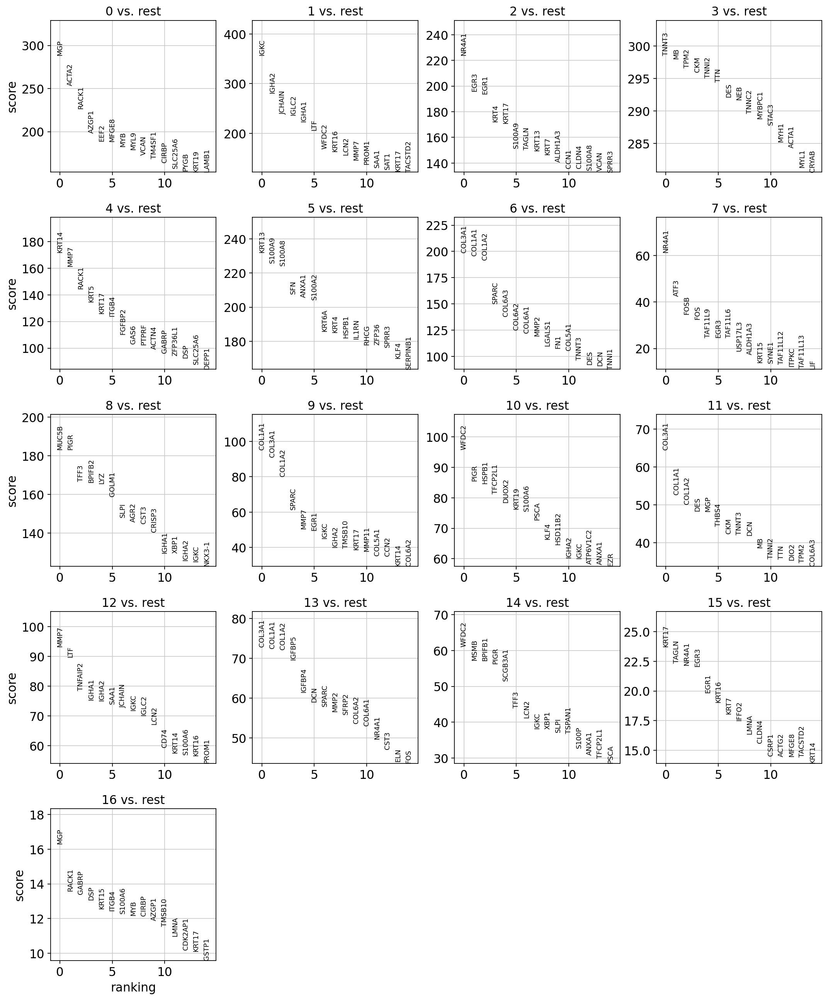

Top 15 genes saved to: /home/jselab/ifeoma/latest_preprocessing/stst02rank_groups_ncmps15_0_12_just15_genes.csv


In [50]:
sc.tl.rank_genes_groups(adata_bin, 'leiden', method='wilcoxon')

# Plot the top 15 ranked genes
sc.pl.rank_genes_groups(adata_bin, n_genes=15, sharey=False)

# Get the DataFrame of ranked genes
df = sc.get.rank_genes_groups_df(adata_bin, None)

# Select the top 15 ranked genes for each cluster
top_15_genes = df.groupby('group').head(15)

# Specify the output file path
output_file = '/home/jselab/ifeoma/latest_preprocessing/stst02rank_groups_ncmps15_0_12_just15_genes.csv'

# Save the top 15 genes to a CSV file
top_15_genes.to_csv(output_file, index=False)

# Print confirmation
print(f"Top 15 genes saved to: {output_file}")